<a href="https://colab.research.google.com/github/tianiayu/Itenas-Projects/blob/main/image%20stitching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

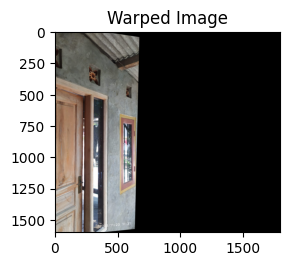

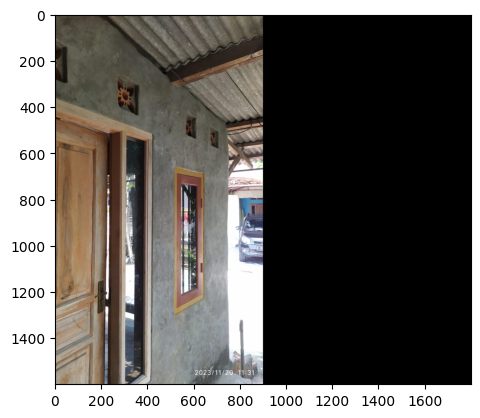

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img_ = cv2.imread("1.jpeg")
img1 = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)
img = cv2.imread("2.jpeg")
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)


bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=3)

# Apply ratio test
good = []
for m in matches:
    if m[0].distance < 0.5 * m[1].distance:
        good.append(m)

matches = np.asarray(good)

if len(matches[:, 0]) >= 4:
    src = np.float32([kp1[m.queryIdx].pt for m in matches[:, 0]]).reshape(-1, 1, 2)
    dst = np.float32([kp2[m.trainIdx].pt for m in matches[:, 0]]).reshape(-1, 1, 2)
    H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
else:
    raise AssertionError("Can’t find enough keypoints.")

dst = cv2.warpPerspective(img_, H, (img.shape[1] + img_.shape[1], img.shape[0]))
plt.subplot(122), plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)), plt.title("Warped Image")
plt.show()

plt.figure()
dst[0:img.shape[0], 0:img.shape[1]] = img
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
plt.show()

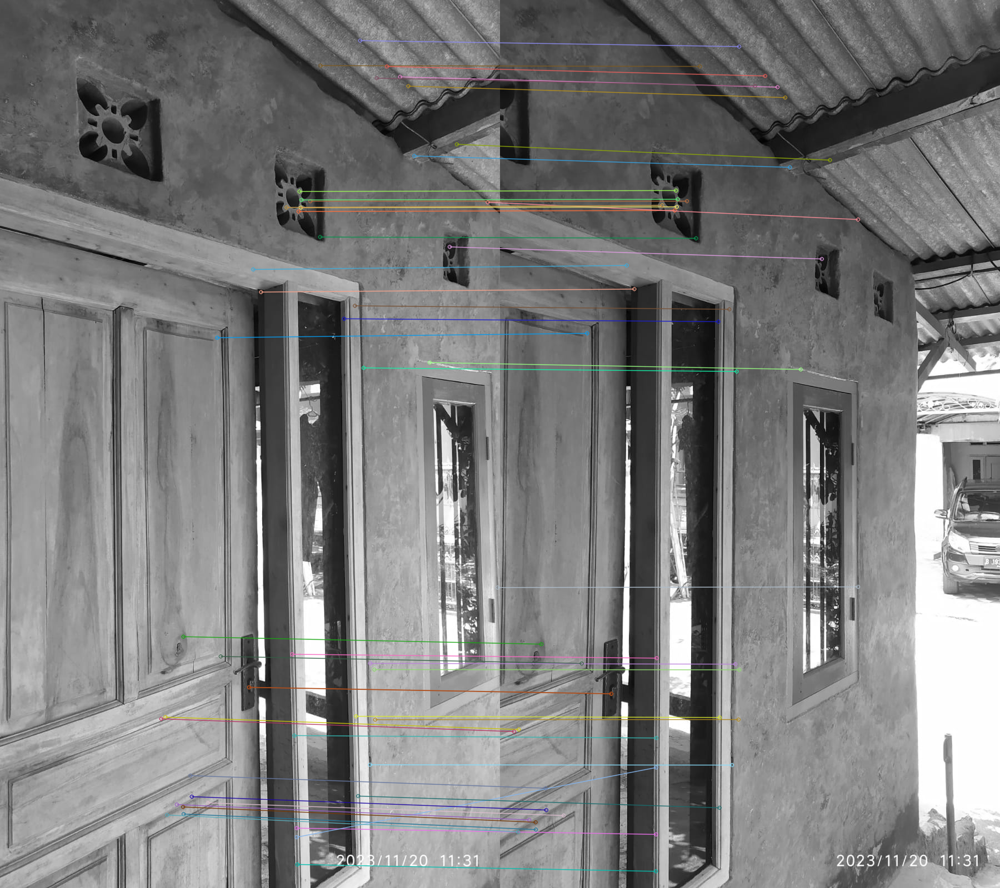

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Imports 10 images
img_files = ['1.jpeg', '2.jpeg', '3.jpeg', '4.jpeg', '5.jpeg',
             '6.jpeg', '7.jpeg', '8.jpeg', '9.jpeg', '10.jpeg']
imgs = []
for file in img_files:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgs.append(img)

# Finds the keypoints and descriptors using SIFT
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(imgs[0], None)
kp2, des2 = sift.detectAndCompute(imgs[1], None)

# Matches the keypoints using the Brute-Force Matcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draws the matched keypoints
img3 = cv2.drawMatches(imgs[0], kp1, imgs[1], kp2, matches[:50], None, flags=2)

# Displays the image
cv2_imshow(img3)

# Waits for a key and closes the window
cv2.waitKey(0)
cv2.destroyAllWindows()

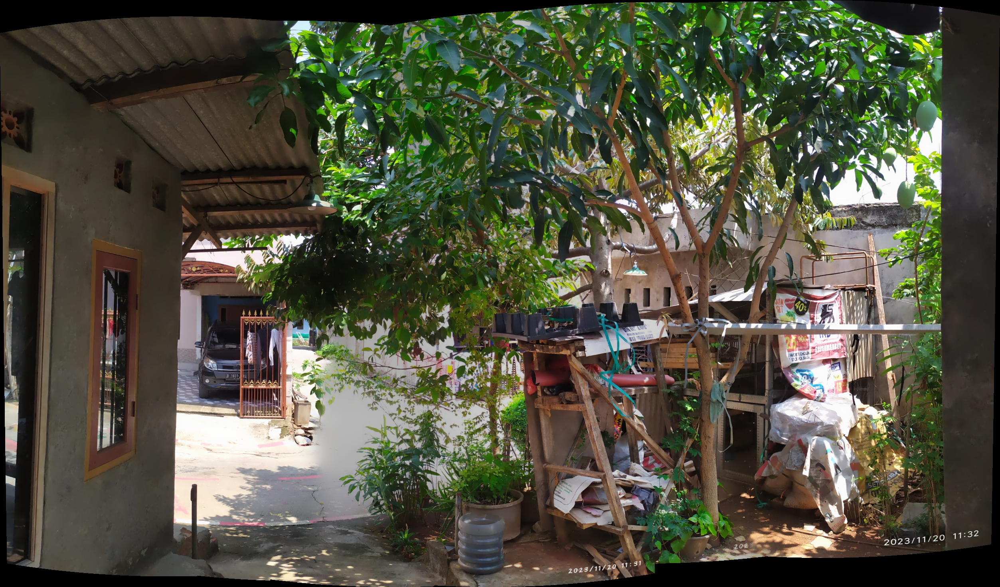

In [ ]:
import cv2
from google.colab.patches import cv2_imshow  # Import cv2_imshow for displaying images in Colab

# Fungsi untuk membaca dan memuat gambar
def load_images(file_paths):
    images = []
    for path in file_paths:
        img = cv2.imread(path)
        images.append(img)
    return images

# Fungsi untuk melakukan image stitching
def image_stitching(images):
    stitcher = cv2.Stitcher_create()
    status, panorama = stitcher.stitch(images)
    if status == cv2.Stitcher_OK:
        return panorama
    else:
        print("Gagal membuat panorama:", status)
        return None

# Daftar file path gambar yang akan di-stitch
file_paths = [
    '1.jpeg', '2.jpeg', '3.jpeg', '4.jpeg', '5.jpeg',
    '6.jpeg', '7.jpeg', '8.jpeg', '9.jpeg', '10.jpeg'
    # ...Tambahkan path gambar lainnya di sini...
]

# Memuat gambar-gambar dari file path
input_images = load_images(file_paths)

# Melakukan image stitching
result_panorama = image_stitching(input_images)

# Menampilkan hasil panorama jika berhasil
if result_panorama is not None:
    cv2_imshow(result_panorama)  # Gunakan cv2_imshow untuk menampilkan hasil


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Imports 10 images
img_files = ['1.jpeg', '2.jpeg', '3.jpeg', '4.jpeg', '5.jpeg',
             '6.jpeg', '7.jpeg', '8.jpeg', '9.jpeg', '10.jpeg']
imgs = []
for file in img_files:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgs.append(img)

# Finds the keypoints and descriptors using SIFT
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(imgs[0], None)
kp2, des2 = sift.detectAndCompute(imgs[1], None)

# Matches the keypoints using the Brute-Force Matcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draws the matched keypoints
img3 = cv2.drawMatches(imgs[0], kp1, imgs[1], kp2, matches[:50], None, flags=2)

# Displays the image
cv2_imshow(img3)

# Waits for a key and closes the window
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import cv2
import numpy as np
import glob

def stitch_images(image_names):
    images = []
    for filename in image_names:
        image = cv2.imread(filename)
        images.append(image)

    # Filtering images with over 30% of corrupted areas
    filtered_images = []
    for image in images:
        ratio = np.sum(image < 100) / np.prod(image.shape)
        if ratio <= 0.3:
            filtered_images.append(image)

    # Feature detection
    features = []
    for image in filtered_images:
        sift = cv2.xfeatures2d.SIFT_create()
        kp, des = sift.detectAndCompute(image, None)
        features.append((kp, des))

    # Homography estimation and warping
    warped_images = []
    for i in range(len(filtered_images)):
        homography_matrix = np.eye(3)
        if i > 0:
            kp1, kp2, matches = get_matching_points(features[i-1], features[i])
            if len(matches) >= 4:
                homography_matrix = find_homography(kp1, kp2, matches)
        warped_image = cv2.warpPerspective(filtered_images[i], homography_matrix, (0, 0))
        warped_images.append(warped_image)

    # Blending
    result = np.zeros_like(warped_images[0])
    for image in warped_images:
        result = cv2.addWeighted(result, 0.5, image, 0.5, 0)

    # Export panorama
    cv2.imwrite('panorama.jpg', result)

def get_matching_points(features1, features2):
    # Use a Brute-Force matcher with Hamming distance
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(features1[1], features2[1])
    matches = sorted(matches, key=lambda x: x.distance)
    p1 = np.float32([features1[0][m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    p2 = np.float32([features2[0][m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    return p1, p2, matches

def find_homography(src_points, dst_points, matches):
    # Use the RANSAC method to estimate the homography matrix
    homography_matrix, _ = cv2.findHomography(src_points, dst_points, cv2.RANSAC, 5.0)
    return homography_matrix

if __name__ == '__main__':
    # Replace 'foto_gedung/*.jpg' with your own file path
    image_names = glob.glob('foto_gedung/*.jpg')
    stitch_images(image_names)

IndexError: ignored

In [ ]:
import cv2
import numpy as np

# Fungsi untuk mendeteksi fitur korespondensi antar foto
def detect_features(image1, image2):
    # Buat objek detector SIFT
    sift = cv2.SIFT_create()

    # Deteksi fitur pada kedua foto
    kp1, des1 = sift.detectAndCompute(image1, None)
    kp2, des2 = sift.detectAndCompute(image2, None)

    # Buat matcher untuk mencocokkan fitur antar foto
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)

    # Urutkan matches berdasarkan jarak
    matches = sorted(matches, key=lambda x: x.distance)

    # Ambil matches terbaik
    good_matches = matches[:int(len(matches) * 0.8)]

    return good_matches

# Fungsi untuk menghitung homografi antar foto
def estimate_homography(good_matches, image1, image2):
    # Buat objek matcher untuk mencocokkan fitur antar foto
    pts1 = np.array([kp1[m.queryIdx].pt for m in good_matches])
    pts2 = np.array([kp2[m.trainIdx].pt for m in good_matches])

    # Hitung homografi
    H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransacReprojThreshold=5.0)

    return H

# Fungsi untuk warping gambar sesuai homografi
def warp_image(image, H):
    # Buat objek warp affine
    w = cv2.warpAffine(image, H, (image.shape[1], image.shape[0]))

    return w

# Fungsi untuk blending dua gambar
def blend_images(image1, image2, alpha):
    # Buat gambar hasil blending
    output = cv2.addWeighted(image1, alpha, image2, 1 - alpha, 0)

    return output

# Fungsi untuk membuat panorama 360 derajat
def create_panorama(images):
    # Buat objek matcher untuk mencocokkan fitur antar foto
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    # Mulai dari foto pertama
    i = 0

    # Iterasi ke semua foto berikutnya
    while i < len(images) - 1:
        # Deteksi fitur korespondensi antar foto
        good_matches = detect_features(images[i], images[i + 1])

        # Hitung homografi antar foto
        H = estimate_homography(good_matches, images[i], images[i + 1])

        # Warp foto kedua sesuai homografi
        w2 = warp_image(images[i + 1], H)

        # Blend foto pertama dan kedua
        output = blend_images(images[i], w2, 0.5)

        # Ganti foto kedua dengan hasil blending
        images[i + 1] = output

        # Update indeks foto
        i += 1

    # Kembalikan foto panorama
    return images[0]

# Fungsi untuk mengekspor panorama
def export_panorama(image, filename):
    # Simpan panorama ke file
    cv2.imwrite(filename, image)

# Main program
if __name__ == "__main__":
    # Load data input
    images = []
    for i in range(36):
        images.append(cv2.imread("image{:02d}.jpg".format(i)))

    # Buat panorama
    panorama = create_panorama(images)

    # Ekspor panorama
    export_panorama(panorama, "panorama.jpg")



error: ignored

In [ ]:
pip install --upgrade opencv-python


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 12.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.8.0.76
    Uninstalling opencv-python-4.8.0.76:
      Successfully uninstalled opencv-python-4.8.0.76


In [ ]:
import cv2
import numpy as np

def preprocessing(images):
    processed_images = []

    for img_path in images:
        img = cv2.imread(img_path)

        # Filtering foto buram atau under/over exposure
        img = cv2.GaussianBlur(img, (5, 5), 0)

        # Koreksi warna untuk konsistensi warna antar foto
        img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
        img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
        img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

        processed_images.append(img)

    return processed_images

def image_stitching(images, output_path):
    # Inisialisasi pembuat fitur dan matcher
    sift = cv2.SIFT_create()
    bf = cv2.BFMatcher()

    # Inisialisasi list untuk menyimpan keypoints dan deskriptor
    keypoints_list = []
    descriptors_list = []

    for img in images:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        keypoints, descriptors = sift.detectAndCompute(gray, None)
        keypoints_list.append(keypoints)
        descriptors_list.append(descriptors)

    # Loop untuk menggabungkan gambar secara berurutan
    result = images[0]

    for i in range(1, len(images)):
        matches = bf.knnMatch(descriptors_list[i-1], descriptors_list[i], k=2)

        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)

        src_pts = np.float32([keypoints_list[i-1][m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([keypoints_list[i][m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

        # Estimasi transformasi affine
        H, _ = cv2.estimateAffinePartial2D(dst_pts, src_pts)

        result = cv2.warpAffine(result, H, (result.shape[1] + images[i].shape[1], result.shape[0]))
        result[0:images[i].shape[0], 0:images[i].shape[1]] = images[i]

    # Simpan hasil panorama
    cv2.imwrite(output_path, result)

    # Menampilkan hasil image stitching
    cv2.imshow('Panorama', result)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Contoh penggunaan
input_images = ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg',
                '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg']

# Preprocessing
processed_images = preprocessing(input_images)

# Image Stitching
output_panorama_path = 'panorama_output.jpg'
image_stitching(processed_images, output_panorama_path)


DisabledFunctionError: ignored